In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here are several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/nuscenes/v1.0-mini.tgz


In [2]:
!tar -xf "/kaggle/input/nuscenes/v1.0-mini.tgz"

In [3]:
!pip install nuscenes-devkit

INFO: pip is looking at multiple versions of opencv-python-headless to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 316.0/316.0 kB 7.1 MB/s eta 0:00:00ta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 MB 17.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 62.9 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 6.0 MB/s eta 0:00:00
  Attempting uninstall: Shapely
    Found existing installation: shapely 2.1.2
    Uninstalling shapely-2.1.2:
      Successfully uninstalled shapely-2.1.2
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This be

In [6]:
from nuscenes.nuscenes import NuScenes

nusc = NuScenes(version='v1.0-mini', dataroot="/kaggle/working", verbose=True)

Loading NuScenes tables for version v1.0-mini...
23 category,
8 attribute,
4 visibility,
911 instance,
12 sensor,
120 calibrated_sensor,
31206 ego_pose,
8 log,
10 scene,
404 sample,
31206 sample_data,
18538 sample_annotation,
4 map,
Done loading in 0.664 seconds.
Reverse indexing ...
Done reverse indexing in 0.1 seconds.


In [6]:
nusc.list_scenes()

scene-0061, Parked truck, construction, intersectio... [18-07-24 03:28:47]   19s, singapore-onenorth, #anns:4622
scene-0103, Many peds right, wait for turning car, ... [18-08-01 19:26:43]   19s, boston-seaport, #anns:2046
scene-0655, Parking lot, parked cars, jaywalker, be... [18-08-27 15:51:32]   20s, boston-seaport, #anns:2332
scene-0553, Wait at intersection, bicycle, large tr... [18-08-28 20:48:16]   20s, boston-seaport, #anns:1950
scene-0757, Arrive at busy intersection, bus, wait ... [18-08-30 19:25:08]   20s, boston-seaport, #anns:592
scene-0796, Scooter, peds on sidewalk, bus, cars, t... [18-10-02 02:52:24]   20s, singapore-queensto, #anns:708
scene-0916, Parking lot, bicycle rack, parked bicyc... [18-10-08 07:37:13]   20s, singapore-queensto, #anns:2387
scene-1077, Night, big street, bus stop, high speed... [18-11-21 11:39:27]   20s, singapore-hollandv, #anns:890
scene-1094, Night, after rain, many peds, PMD, ped ... [18-11-21 11:47:27]   19s, singapore-hollandv, #anns:1762
sc

In [8]:
my_scene = nusc.scene[0]
my_scene

{'token': 'cc8c0bf57f984915a77078b10eb33198',
 'log_token': '7e25a2c8ea1f41c5b0da1e69ecfa71a2',
 'nbr_samples': 39,
 'first_sample_token': 'ca9a282c9e77460f8360f564131a8af5',
 'last_sample_token': 'ed5fc18c31904f96a8f0dbb99ff069c0',
 'name': 'scene-0061',
 'description': 'Parked truck, construction, intersection, turn left, following a van'}

In [9]:
first_sample_token = my_scene['first_sample_token']

In [10]:
my_sample = nusc.get('sample', first_sample_token)
my_sample

{'token': 'ca9a282c9e77460f8360f564131a8af5',
 'timestamp': 1532402927647951,
 'prev': '',
 'next': '39586f9d59004284a7114a68825e8eec',
 'scene_token': 'cc8c0bf57f984915a77078b10eb33198',
 'data': {'RADAR_FRONT': '37091c75b9704e0daa829ba56dfa0906',
  'RADAR_FRONT_LEFT': '11946c1461d14016a322916157da3c7d',
  'RADAR_FRONT_RIGHT': '491209956ee3435a9ec173dad3aaf58b',
  'RADAR_BACK_LEFT': '312aa38d0e3e4f01b3124c523e6f9776',
  'RADAR_BACK_RIGHT': '07b30d5eb6104e79be58eadf94382bc1',
  'LIDAR_TOP': '9d9bf11fb0e144c8b446d54a8a00184f',
  'CAM_FRONT': 'e3d495d4ac534d54b321f50006683844',
  'CAM_FRONT_RIGHT': 'aac7867ebf4f446395d29fbd60b63b3b',
  'CAM_BACK_RIGHT': '79dbb4460a6b40f49f9c150cb118247e',
  'CAM_BACK': '03bea5763f0f4722933508d5999c5fd8',
  'CAM_BACK_LEFT': '43893a033f9c46d4a51b5e08a67a1eb7',
  'CAM_FRONT_LEFT': 'fe5422747a7d4268a4b07fc396707b23'},
 'anns': ['ef63a697930c4b20a6b9791f423351da',
  '6b89da9bf1f84fd6a5fbe1c3b236f809',
  '924ee6ac1fed440a9d9e3720aac635a0',
  '91e3608f55174a319

In [11]:
my_sample['data']

{'RADAR_FRONT': '37091c75b9704e0daa829ba56dfa0906',
 'RADAR_FRONT_LEFT': '11946c1461d14016a322916157da3c7d',
 'RADAR_FRONT_RIGHT': '491209956ee3435a9ec173dad3aaf58b',
 'RADAR_BACK_LEFT': '312aa38d0e3e4f01b3124c523e6f9776',
 'RADAR_BACK_RIGHT': '07b30d5eb6104e79be58eadf94382bc1',
 'LIDAR_TOP': '9d9bf11fb0e144c8b446d54a8a00184f',
 'CAM_FRONT': 'e3d495d4ac534d54b321f50006683844',
 'CAM_FRONT_RIGHT': 'aac7867ebf4f446395d29fbd60b63b3b',
 'CAM_BACK_RIGHT': '79dbb4460a6b40f49f9c150cb118247e',
 'CAM_BACK': '03bea5763f0f4722933508d5999c5fd8',
 'CAM_BACK_LEFT': '43893a033f9c46d4a51b5e08a67a1eb7',
 'CAM_FRONT_LEFT': 'fe5422747a7d4268a4b07fc396707b23'}

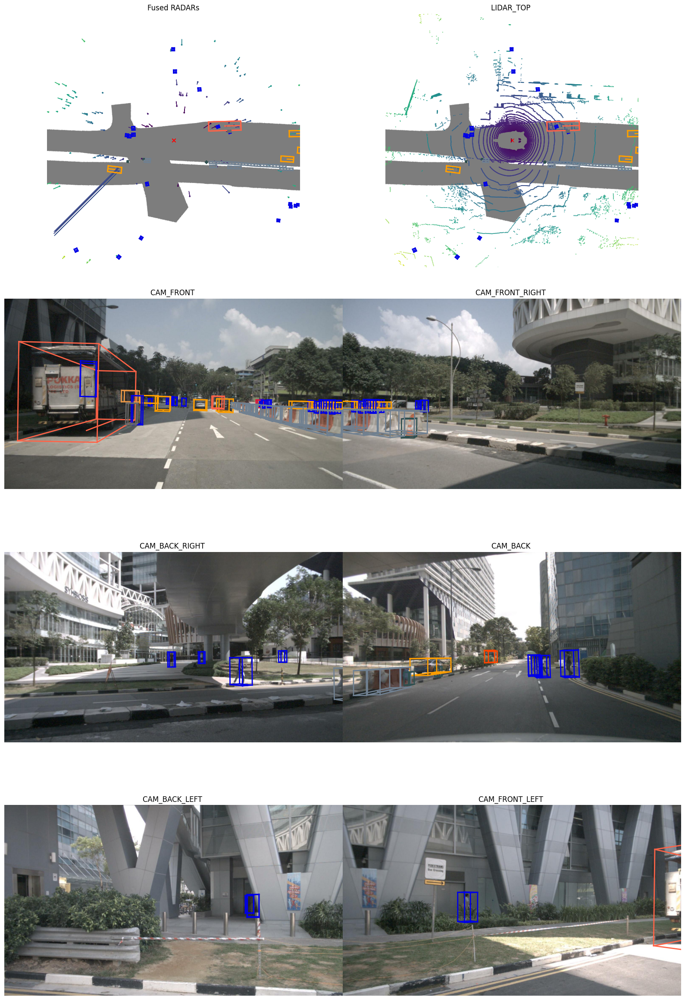

In [12]:
nusc.render_sample(first_sample_token)

In [13]:
nusc.sample_annotation[0]

{'token': '70aecbe9b64f4722ab3c230391a3beb8',
 'sample_token': 'cd21dbfc3bd749c7b10a5c42562e0c42',
 'instance_token': '6dd2cbf4c24b4caeb625035869bca7b5',
 'visibility_token': '4',
 'attribute_tokens': ['4d8821270b4a47e3a8a300cbec48188e'],
 'translation': [373.214, 1130.48, 1.25],
 'size': [0.621, 0.669, 1.642],
 'rotation': [0.9831098797903927, 0.0, 0.0, -0.18301629506281616],
 'prev': 'a1721876c0944cdd92ebc3c75d55d693',
 'next': '1e8e35d365a441a18dd5503a0ee1c208',
 'num_lidar_pts': 5,
 'num_radar_pts': 0,
 'category_name': 'human.pedestrian.adult'}

In [14]:
nusc.get('visibility', nusc.sample_annotation[0]['visibility_token'])

{'description': 'visibility of whole object is between 80 and 100%',
 'token': '4',
 'level': 'v80-100'}

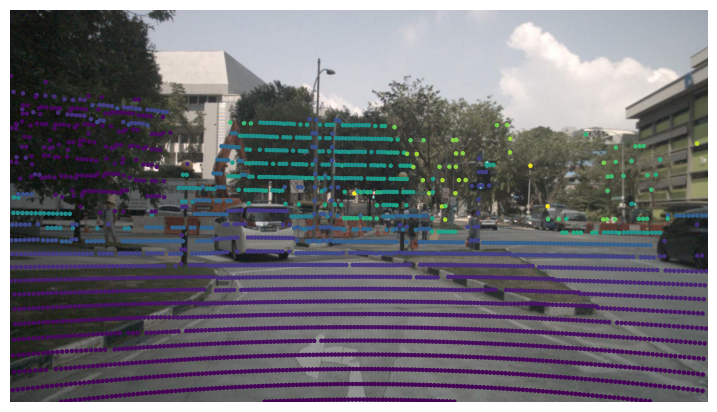

In [15]:
my_sample = nusc.sample[10]
nusc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_TOP')

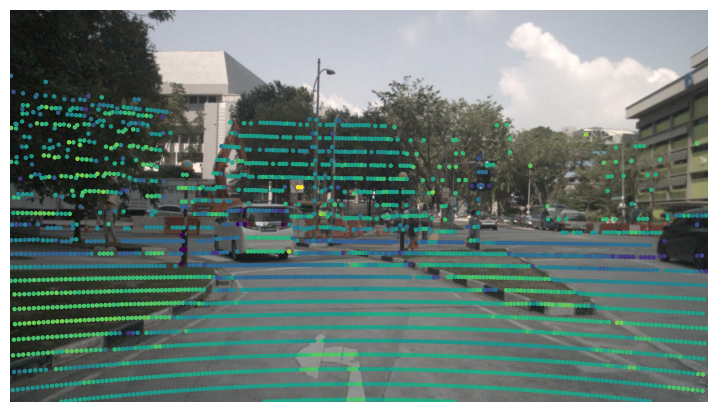

In [16]:
nusc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='LIDAR_TOP', render_intensity=True)

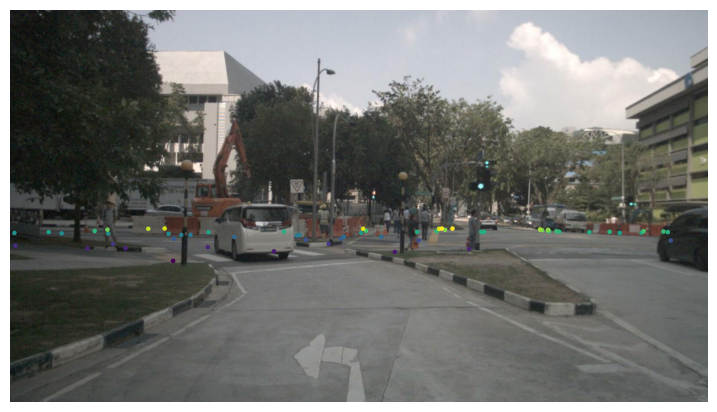

In [17]:
nusc.render_pointcloud_in_image(my_sample['token'], pointsensor_channel='RADAR_FRONT')

In [18]:
my_sample = nusc.sample[20]

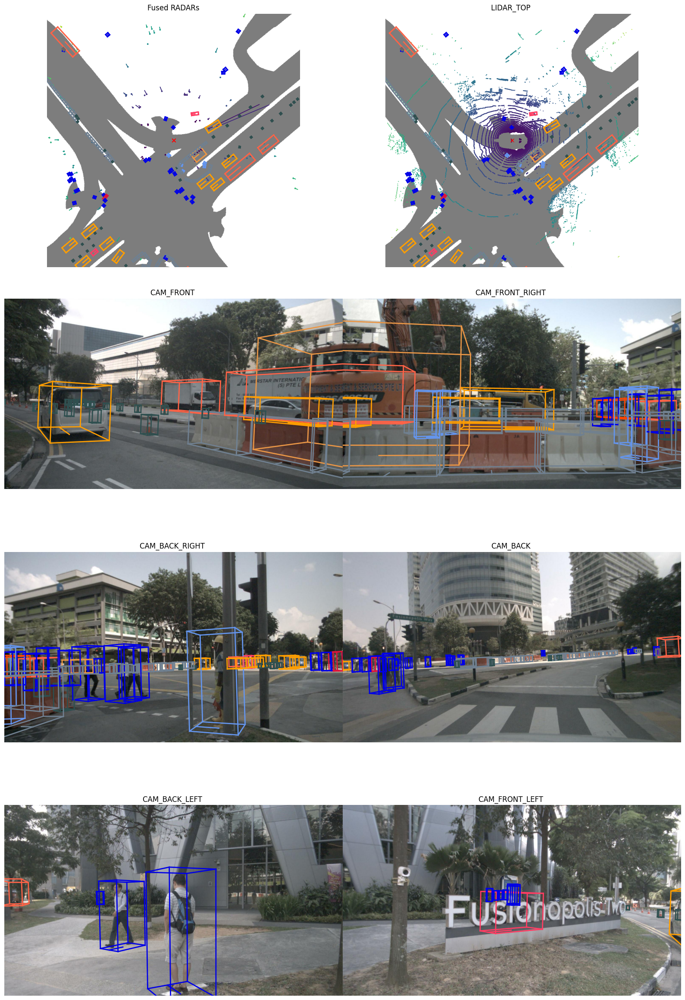

In [19]:
nusc.render_sample(my_sample['token'])

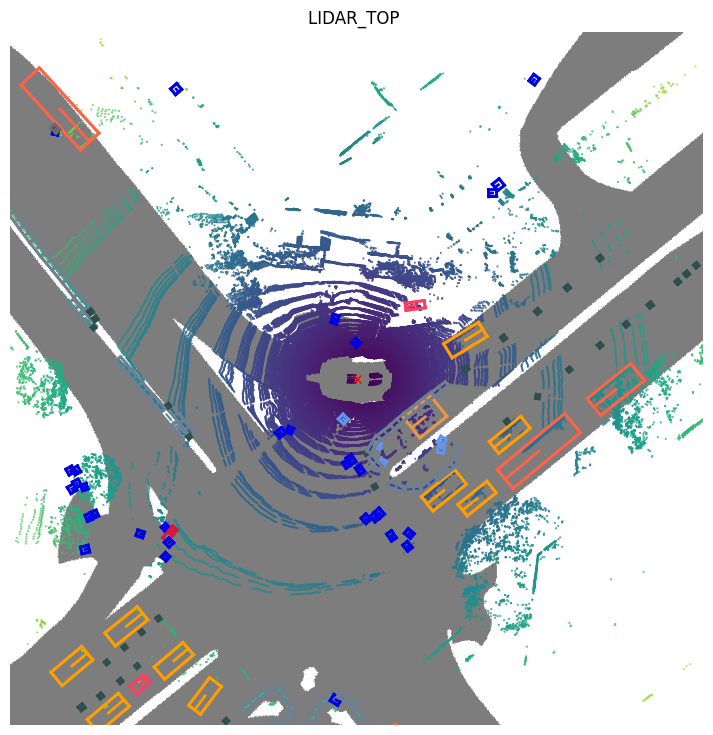

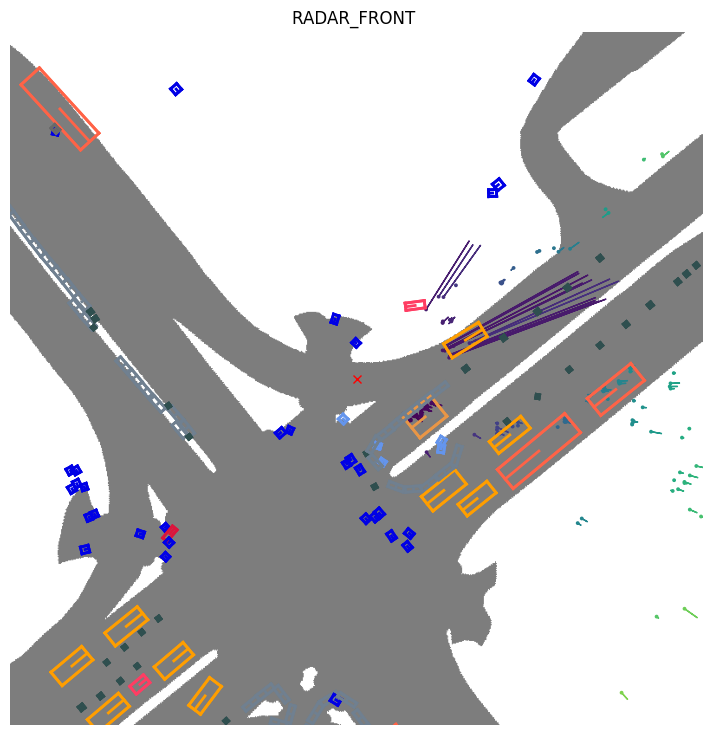

In [20]:
nusc.render_sample_data(my_sample['data']['LIDAR_TOP'], nsweeps=5, underlay_map=True)
nusc.render_sample_data(my_sample['data']['RADAR_FRONT'], nsweeps=5, underlay_map=True)

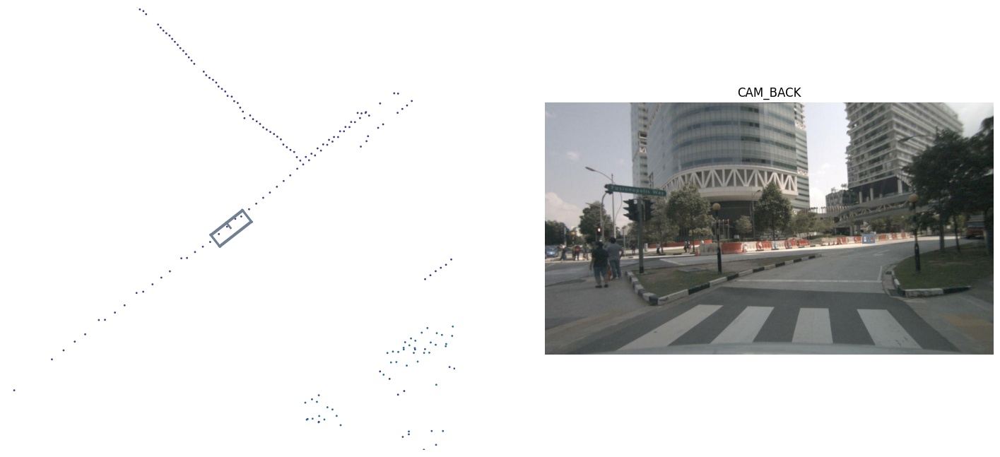

In [21]:
nusc.render_annotation(my_sample['anns'][22])

In [22]:
my_scene_token = nusc.field2token('scene', 'name', 'scene-0061')[0]

Adding ego poses to map...


100%|██████████| 1/1 [00:00<00:00, 309.00it/s]

Creating plot...


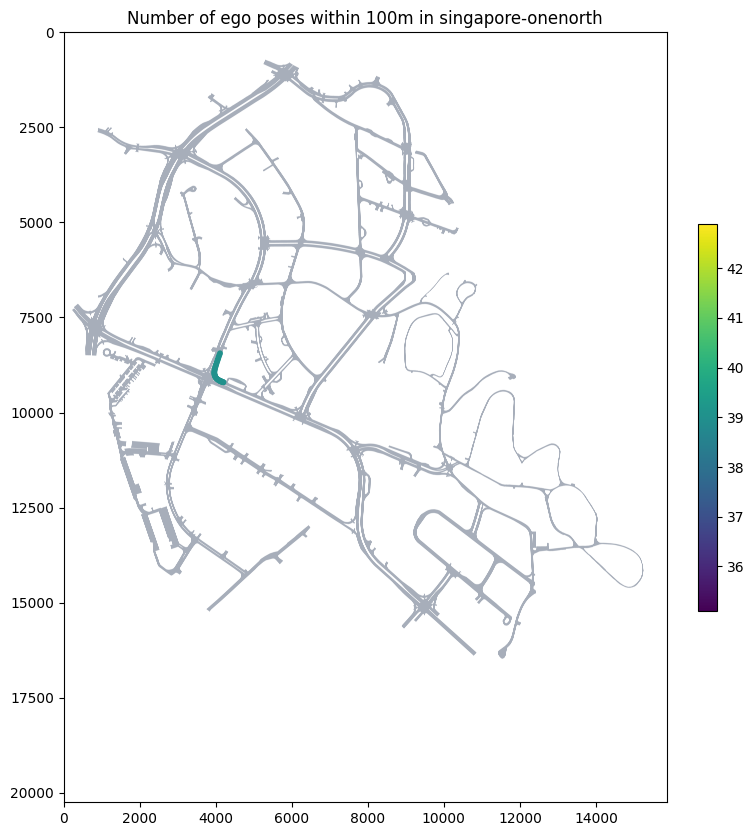

In [23]:
nusc.render_egoposes_on_map(log_location='singapore-onenorth')

# Camera into BEV [B, C_img, H_img, W_img]

In [5]:
import cv2
import numpy as np
import torch

In [7]:
sample = nusc.sample[0]

In [8]:
cam_token = sample['data']['CAM_FRONT']
cam_data = nusc.get('sample_data', cam_token)
img_path = nusc.get_sample_data_path(cam_token)
image = cv2.imread(img_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [9]:
import torchvision.transforms as T

transform = T.Compose([
    T.ToTensor(),
    T.Resize((256, 704)),   # typical for BEVDet
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std =[0.229, 0.224, 0.225]),
])


In [10]:
img_tensor = transform(image).unsqueeze(0)   # shape [1,3,H,W]

In [11]:
img_tensor.shape

torch.Size([1, 3, 256, 704])

In [12]:
import torchvision.models as models

resnet = models.resnet50(pretrained=True)
resnet = torch.nn.Sequential(*list(resnet.children())[:-2])  # remove average pool & FC
resnet.eval()


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 160MB/s] 


Sequential(
  (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU(inplace=True)
  (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (4): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)


In [14]:
with torch.no_grad():
    img_feat = resnet(img_tensor)  # [1, 2048, H/32, W/32] → e.g. [1, 2048, 8, 22]


In [17]:
img_feat.shape

torch.Size([1, 2048, 8, 22])

In [18]:
class DepthNet(torch.nn.Module):
    def __init__(self, in_channels=2048, D=80):
        super().__init__()
        self.conv = torch.nn.Conv2d(in_channels, D, kernel_size=1)

    def forward(self, x):
        return torch.softmax(self.conv(x), dim=1)

depth_net = DepthNet()


In [19]:
with torch.no_grad():
    depth_prob = depth_net(img_feat)   # [1, 80, H/32, W/32]


In [20]:
depth_prob.shape

torch.Size([1, 80, 8, 22])

In [21]:
volume = depth_prob.unsqueeze(2) * img_feat.unsqueeze(1)

In [22]:
volume.shape

torch.Size([1, 80, 2048, 8, 22])

In [23]:
cs_record = nusc.get('calibrated_sensor', cam_data['calibrated_sensor_token'])
cam_intrinsic = np.array(cs_record['camera_intrinsic'])

In [25]:
cam_intrinsic

array([[1.26641720e+03, 0.00000000e+00, 8.16267020e+02],
       [0.00000000e+00, 1.26641720e+03, 4.91507066e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [28]:
ego_pose = nusc.get('ego_pose', cam_data['ego_pose_token'])

# Sensor-to-ego transform
R = np.array(cs_record['rotation'])
T = np.array(cs_record['translation'])

# Ego-to-world transform
R_ego = np.array(ego_pose['rotation'])
T_ego = np.array(ego_pose['translation'])
print(R,T)
print(R_ego,T_ego)

[ 0.49980154 -0.50303162  0.49977981 -0.49737084] [1.70079119 0.01594563 1.51095764]
[ 0.57200635 -0.00214348  0.01156409 -0.82016487] [ 411.41998618 1181.19717563    0.        ]


In [37]:
import numpy as np

def quat_to_rotmat(q):
    """
    q = [qw, qx, qy, qz]
    returns 3x3 rotation matrix
    """
    qw, qx, qy, qz = q

    R = np.array([
        [1 - 2*qy*qy - 2*qz*qz,     2*qx*qy - 2*qz*qw,     2*qx*qz + 2*qy*qw],
        [2*qx*qy + 2*qz*qw,         1 - 2*qx*qx - 2*qz*qz, 2*qy*qz - 2*qx*qw],
        [2*qx*qz - 2*qy*qw,         2*qy*qz + 2*qx*qw,     1 - 2*qx*qx - 2*qy*qy]
    ])

    return R


In [38]:
R = quat_to_rotmat(R)
T = np.array(T)

In [40]:
print(R,T)

[[ 5.68477868e-03 -5.63666773e-03  9.99967955e-01]
 [-9.99983517e-01 -8.37115272e-04  5.68014846e-03]
 [ 8.05071338e-04 -9.99983763e-01 -5.64133364e-03]] [1.70079119 0.01594563 1.51095764]


In [35]:
# Scaling
H_img, W_img = image.shape[0], image.shape[1]  # original
Hf, Wf = volume.shape[-2], volume.shape[-1]    # feature map size (8 × 22)

scale_x = Wf / W_img
scale_y = Hf / H_img

cam_intrinsic_scaled = cam_intrinsic.copy()
cam_intrinsic_scaled[0,0] *= scale_x   # fx
cam_intrinsic_scaled[1,1] *= scale_y   # fy
cam_intrinsic_scaled[0,2] *= scale_x   # cx
cam_intrinsic_scaled[1,2] *= scale_y   # cy


In [34]:
import torch

def create_bev_features(
        volume,                # [B, D, C, Hf, Wf]
        cam_intrinsic,         # 3x3 full-resolution intrinsics
        R, T,                  # cam->ego
        x_range=(0, 50),
        y_range=(-25, 25),
        depth_range=(1, 60),
        voxel_size=0.2):

    B, D, C, Hf, Wf = volume.shape
    device = volume.device

    # --------------------------
    # 1. Adjust intrinsics to feature resolution
    # --------------------------
    # Suppose original image = 900x1600, feature = 8x22 (resized)
    # Scaling:
    sx = Wf / cam_intrinsic[0, 2] / 2   # approximate scale
    sy = Hf / cam_intrinsic[1, 2] / 2

    K = torch.tensor(cam_intrinsic, dtype=torch.float32, device=device)
    fx = K[0,0] * sx
    fy = K[1,1] * sy
    cx = K[0,2] * sx
    cy = K[1,2] * sy

    # --------------------------
    # 2. Build depth bins
    # --------------------------
    depth_bins = torch.linspace(depth_range[0], depth_range[1], D, device=device)
    depths = depth_bins.view(1, D, 1, 1).expand(B, D, Hf, Wf)

    # --------------------------
    # 3. Build pixel grid at feature resolution
    # --------------------------
    xs = torch.linspace(0, Wf-1, Wf, device=device).view(1,1,1,Wf).expand(B, D, Hf, Wf)
    ys = torch.linspace(0, Hf-1, Hf, device=device).view(1,1,Hf,1).expand(B, D, Hf, Wf)

    # --------------------------
    # 4. Backproject (u,v,depth) → camera coords
    # --------------------------
    X_cam = (xs - cx) / fx * depths
    Y_cam = (ys - cy) / fy * depths
    Z_cam = depths

    # shape [B, 3, N]
    cam_points = torch.stack([X_cam, Y_cam, Z_cam], dim=1).reshape(B, 3, -1)

    # --------------------------
    # 5. Camera → Ego transform
    # --------------------------
    R = torch.tensor(R, dtype=torch.float32, device=device)
    T = torch.tensor(T, dtype=torch.float32, device=device).view(3,1)

    ego_points = R.unsqueeze(0) @ cam_points + T.unsqueeze(0)  # [B,3,N]

    # --------------------------
    # 6. Convert to BEV grid coordinates
    # --------------------------
    x = ego_points[:, 0]     # forward
    y = ego_points[:, 1]     # left/right

    H_bev = int((x_range[1] - x_range[0]) / voxel_size)
    W_bev = int((y_range[1] - y_range[0]) / voxel_size)

    bev_x = ((x - x_range[0]) / voxel_size).long()
    bev_y = ((y - y_range[0]) / voxel_size).long()

    valid = (bev_x >= 0) & (bev_x < H_bev) & (bev_y >= 0) & (bev_y < W_bev)

    # --------------------------
    # 7. Scatter-lift features into BEV
    # --------------------------
    feats = volume.permute(0,2,1,3,4).reshape(B, C, -1)

    bev = torch.zeros(B, C, H_bev, W_bev, device=device)

    for b in range(B):
        mask = valid[b]
        xs_ = bev_x[b][mask]
        ys_ = bev_y[b][mask]

        idx = xs_ * W_bev + ys_
        feats_b = feats[b,:,mask]      # [C, N]

        bev_flat = bev[b].view(C, -1)
        bev_flat.index_add_(1, idx, feats_b)

    return bev


In [41]:
with torch.no_grad():
    bev_feature_map = create_bev_features(
        volume,
        cam_intrinsic_scaled,
        R, T
    )

print("Input Volume:", volume.shape)
print("BEV Feature Map:", bev_feature_map.shape)

Input Volume: torch.Size([1, 80, 2048, 8, 22])
BEV Feature Map: torch.Size([1, 2048, 250, 250])


### Visualisation

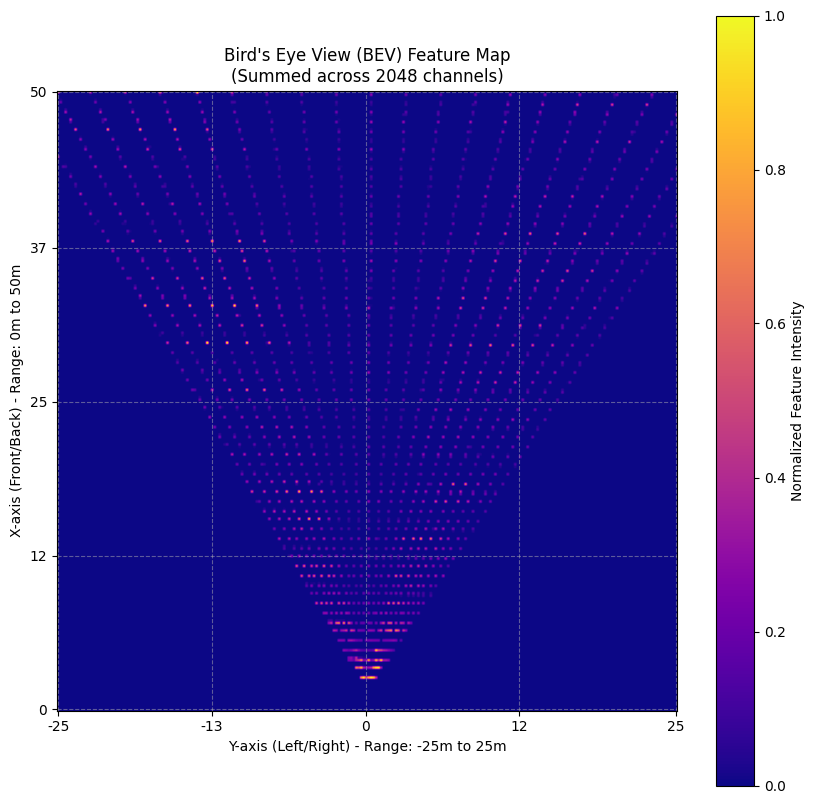

In [42]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# --- ASSUMPTIONS ---
# 1. 'bev_feature_map' is your torch tensor of shape [B, C, H_bev, W_bev]
# 2. BEV_PARAMS from before:
BEV_PARAMS = {
    'x_range': (0, 50),     # X (front/back) range in meters
    'y_range': (-25, 25),   # Y (left/right) range in meters
    'voxel_size': 0.2
}
C = 2048 # Number of channels

# -------------------------------------------------------------
# VISUALIZATION STEPS
# -------------------------------------------------------------

# 1. Move to CPU and convert to NumPy
# We take the first item in the batch (index 0)
bev_features_b0 = bev_feature_map[0].cpu().numpy()  # Shape: [C, H_bev, W_bev]

# 2. Dimensionality Reduction (Summation Method)
# Sum the features across the channel dimension (axis 0).
# This gives a single 2D intensity map.
visualization_map = np.sum(bev_features_b0, axis=0)  # Shape: [H_bev, W_bev]

# 3. Normalize the map for better contrast (optional but recommended)
# Rescale values to be between 0 and 1
visualization_map = (visualization_map - visualization_map.min()) / (visualization_map.max() - visualization_map.min())

# 4. Plotting
plt.figure(figsize=(10, 10))

# The 'origin='lower'' is important: it ensures that (0,0) in your BEV grid 
# (the furthest back, furthest left) is plotted at the bottom-left corner,
# matching the real-world ground plane convention.
plt.imshow(visualization_map, origin='lower', cmap='plasma') 

plt.title(f"Bird's Eye View (BEV) Feature Map\n(Summed across {C} channels)")
plt.xlabel(f"Y-axis (Left/Right) - Range: {BEV_PARAMS['y_range'][0]}m to {BEV_PARAMS['y_range'][1]}m")
plt.ylabel(f"X-axis (Front/Back) - Range: {BEV_PARAMS['x_range'][0]}m to {BEV_PARAMS['x_range'][1]}m")

# --- Custom Ticks for Real-World Coordinates ---
H_bev, W_bev = visualization_map.shape

# 5 ticks along the axes
num_ticks = 5

# Create tick locations on the pixel grid
x_pixel_ticks = np.linspace(0, H_bev - 1, num_ticks, dtype=int)
y_pixel_ticks = np.linspace(0, W_bev - 1, num_ticks, dtype=int)

# Create corresponding real-world labels
x_labels = np.linspace(BEV_PARAMS['x_range'][0], BEV_PARAMS['x_range'][1], num_ticks, dtype=int)
y_labels = np.linspace(BEV_PARAMS['y_range'][0], BEV_PARAMS['y_range'][1], num_ticks, dtype=int)

# Apply ticks
plt.xticks(y_pixel_ticks, y_labels) # X-axis in plot is W_bev (Y-world)
plt.yticks(x_pixel_ticks, x_labels) # Y-axis in plot is H_bev (X-world)

plt.colorbar(label='Normalized Feature Intensity')
plt.grid(True, alpha=0.5, linestyle='--')
plt.show()

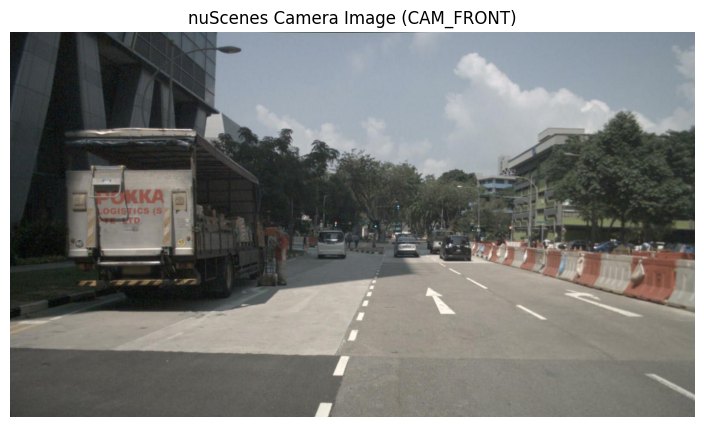

In [43]:
img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10,5))
plt.imshow(img)
plt.title("nuScenes Camera Image (CAM_FRONT)")
plt.axis("off")
plt.show()

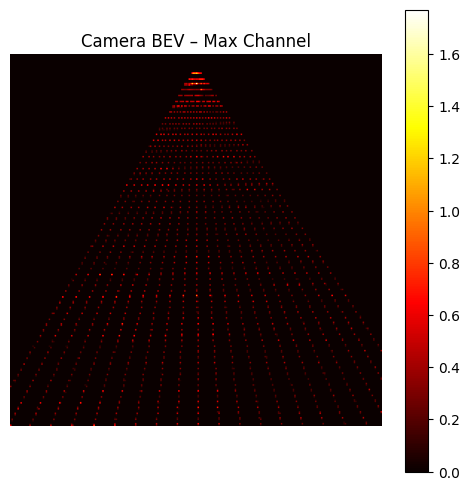

In [44]:
bev = bev_feature_map[0].detach().cpu()   # [C, H_bev, W_bev]
bev_max = bev.max(dim=0)[0].numpy()

plt.figure(figsize=(6,6))
plt.imshow(bev_max, cmap='hot')
plt.title("Camera BEV – Max Channel")
plt.colorbar()
plt.axis("off")
plt.show()


In [45]:
import torch
import numpy as np
import matplotlib.pyplot as plt

bev = bev_feature_map[0].detach().cpu()   # shape [C, H, W]


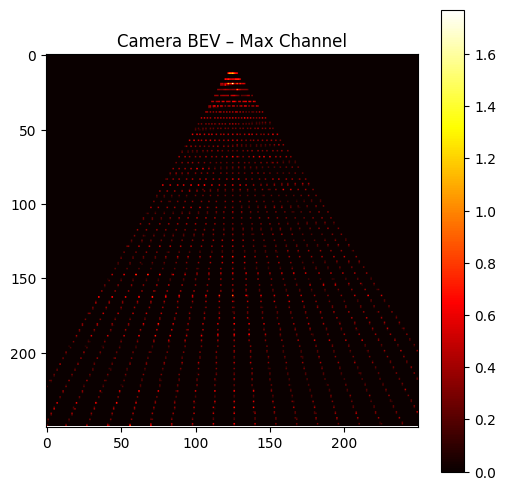

In [46]:
bev_max = bev.max(dim=0)[0].numpy()      # [H, W]

plt.figure(figsize=(6,6))
plt.imshow(bev_max, cmap='hot')
plt.title("Camera BEV – Max Channel")
plt.colorbar()
plt.show()


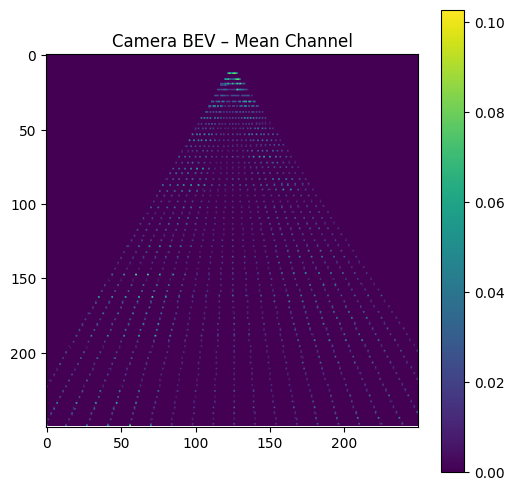

In [47]:
bev_mean = bev.mean(dim=0).numpy()

plt.figure(figsize=(6,6))
plt.imshow(bev_mean, cmap='viridis')
plt.title("Camera BEV – Mean Channel")
plt.colorbar()
plt.show()


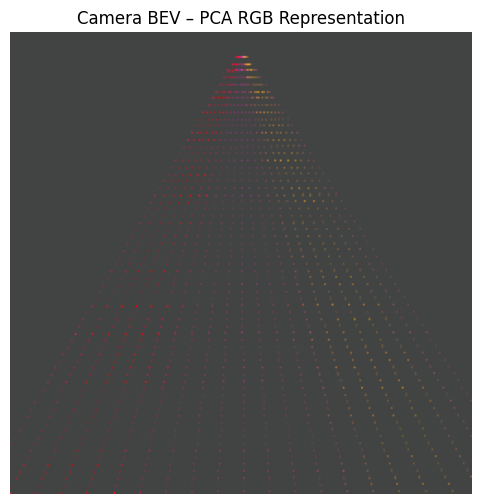

In [48]:
from sklearn.decomposition import PCA

C, H, W = bev.shape
flattened = bev.view(C, -1).T.numpy()    # [H*W, C]

pca = PCA(n_components=3)
bev_pca = pca.fit_transform(flattened)   # [H*W, 3]

# Reshape into image
bev_pca_img = bev_pca.reshape(H, W, 3)
bev_pca_img -= bev_pca_img.min()
bev_pca_img /= bev_pca_img.max()

plt.figure(figsize=(6,6))
plt.imshow(bev_pca_img)
plt.title("Camera BEV – PCA RGB Representation")
plt.axis('off')
plt.show()


BEV shape: torch.Size([1, 2048, 250, 250])


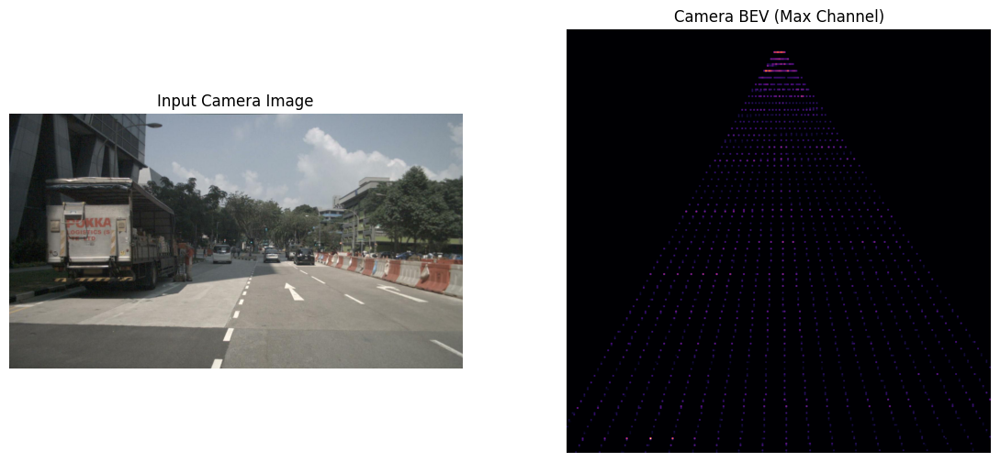

In [62]:
import torch
import torch.nn as nn
import torchvision.transforms as T
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
import cv2
from nuscenes.nuscenes import NuScenes
from sklearn.decomposition import PCA

# ---------------------------------------------------------------------
#  A. Quaternion → Rotation Matrix
# ---------------------------------------------------------------------

def quat_to_rotmat(q):
    qw, qx, qy, qz = q
    R = np.array([
        [1 - 2*(qy*qy + qz*qz),     2*(qx*qy - qz*qw),       2*(qx*qz + qy*qw)],
        [2*(qx*qy + qz*qw),         1 - 2*(qx*qx + qz*qz),   2*(qy*qz - qx*qw)],
        [2*(qx*qz - qy*qw),         2*(qy*qz + qx*qw),       1 - 2*(qx*qx + qy*qy)],
    ])
    return R


# ---------------------------------------------------------------------
#  B. BEV Projection (final correct version)
# ---------------------------------------------------------------------

def create_bev_features(volume, K_feat, R, T,
                        x_range=(0, 50), y_range=(-25, 25),
                        depth_min=1.0, depth_max=60.0,
                        voxel_size=0.2):

    B, D, C, Hf, Wf = volume.shape
    device = volume.device

    # ----- 1. Depth bins -----
    depth_bins = torch.linspace(depth_min, depth_max, D, device=device)
    depths = depth_bins.reshape(1, D, 1, 1).expand(B, D, Hf, Wf)

    # ----- 2. Pixel grid -----
    xs = torch.linspace(0, Wf-1, Wf, device=device).view(1,1,1,Wf).expand(B, D, Hf, Wf)
    ys = torch.linspace(0, Hf-1, Hf, device=device).view(1,1,Hf,1).expand(B, D, Hf, Wf)

    fx, fy = K_feat[0,0], K_feat[1,1]
    cx, cy = K_feat[0,2], K_feat[1,2]

    # ----- 3. Backproject -----
    X_cam = (xs - cx) / fx * depths
    Y_cam = (ys - cy) / fy * depths
    Z_cam = depths

    cam_points = torch.stack([X_cam, Y_cam, Z_cam], dim=1).reshape(B, 3, -1)

    # ----- 4. Camera → Ego -----
    R = torch.tensor(R, dtype=torch.float32, device=device)
    T = torch.tensor(T, dtype=torch.float32, device=device).view(3,1)
    ego = R.unsqueeze(0) @ cam_points + T.unsqueeze(0)

    # ----- 5. BEV indices -----
    x = ego[:, 0]  # forward
    y = ego[:, 1]  # left-right

    H_bev = int((x_range[1] - x_range[0]) / voxel_size)
    W_bev = int((y_range[1] - y_range[0]) / voxel_size)

    bev_x = ((x - x_range[0]) / voxel_size).long()
    bev_y = ((y - y_range[0]) / voxel_size).long()

    valid = (bev_x >= 0) & (bev_x < H_bev) & (bev_y >= 0) & (bev_y < W_bev)

    # ----- 6. Flatten lifted features -----
    feats = volume.permute(0,2,1,3,4).reshape(B, C, -1)

    bev = torch.zeros(B, C, H_bev, W_bev, device=device)

    # ----- 7. Scatter -----
    for b in range(B):
        mask = valid[b]

        bx = bev_x[b][mask]
        by = bev_y[b][mask]
        idx = bx * W_bev + by

        f = feats[b,:,mask]  # [C, N_valid]
        bev_flat = bev[b].view(C, -1)

        bev_flat.index_add_(1, idx, f)

    return bev


# ---------------------------------------------------------------------
#  C. MAIN PIPELINE
# ---------------------------------------------------------------------

# 1. Load nuScenes
sample = nusc.sample[0]
cam_token = sample['data']['CAM_FRONT']
cam_data = nusc.get('sample_data', cam_token)
img_path = nusc.get_sample_data_path(cam_token)

# 2. Load image
image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
orig_H, orig_W = image.shape[:2]

# 3. Preprocess
transform = T.Compose([
    T.ToTensor(),
    T.Resize((256, 704)),
    T.Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225]),
])
img_tensor = transform(image).unsqueeze(0)

# 4. Feature extractor (ResNet-50)
backbone = models.resnet50(pretrained=True)
backbone = nn.Sequential(*list(backbone.children())[:-2])
backbone.eval()

with torch.no_grad():
    img_feat = backbone(img_tensor)   # [1, 2048, 8, 22]

B, C, Hf, Wf = img_feat.shape

# 5. Depth Net
class DepthNet(nn.Module):
    def __init__(self, in_channels=2048, D=80):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, D, 1)
    def forward(self, x):
        return torch.softmax(self.conv(x), dim=1)

depth_net = DepthNet(D=80)

with torch.no_grad():
    depth_prob = depth_net(img_feat)   # [1, 80, 8, 22]

# 6. Lift to volume
volume = depth_prob.unsqueeze(2) * img_feat.unsqueeze(1)   # [1,80,2048,8,22]

# ---------------------------------------------------------------------
#  D. SCALE INTRINSICS (this is the crucial part)
# ---------------------------------------------------------------------

cs = nusc.get('calibrated_sensor', cam_data['calibrated_sensor_token'])
K = np.array(cs["camera_intrinsic"], dtype=np.float32)

# 1. Scale due to image resize 900x1600 → 256x704
scale_x_img = 704.0 / orig_W
scale_y_img = 256.0 / orig_H

K1 = K.copy()
K1[0,0] *= scale_x_img
K1[1,1] *= scale_y_img
K1[0,2] *= scale_x_img
K1[1,2] *= scale_y_img

# 2. Scale due to CNN downsampling 32×
scale_x_feat = Wf / 704.0
scale_y_feat = Hf / 256.0

K_feat = K1.copy()
K_feat[0,0] *= scale_x_feat
K_feat[1,1] *= scale_y_feat
K_feat[0,2] *= scale_x_feat
K_feat[1,2] *= scale_y_feat

# ---------------------------------------------------------------------
#  E. Camera EXTRINSICS
# ---------------------------------------------------------------------

R = quat_to_rotmat(cs["rotation"])  # 3x3
T = np.array(cs["translation"])     # 3

# ---------------------------------------------------------------------
#  F. Compute BEV
# ---------------------------------------------------------------------

with torch.no_grad():
    bev = create_bev_features(
        volume,
        torch.tensor(K_feat, dtype=torch.float32),
        R, T
    )

print("BEV shape:", bev.shape)


# ---------------------------------------------------------------------
#  G. VISUALIZE (Image + BEV)
# ---------------------------------------------------------------------

# BEV visualization (max channel)
bev_map = bev[0].max(0)[0].cpu().numpy()

fig, axes = plt.subplots(1,2, figsize=(14,6))

axes[0].imshow(image)
axes[0].set_title("Input Camera Image")
axes[0].axis("off")

axes[1].imshow(bev_map, cmap='inferno')
axes[1].set_title("Camera BEV (Max Channel)")
axes[1].axis("off")

plt.show()


In [66]:
# BEV grid params (same as earlier to align with LiDAR etc.)
x_range = (-50.0, 50.0)
y_range = (-25.0, 25.0)
voxel_size = 0.2
H_bev = int((x_range[1]-x_range[0]) / voxel_size)
W_bev = int((y_range[1]-y_range[0]) / voxel_size)

# camera names in nuScenes sample data
camera_names = [
    "CAM_FRONT",
    "CAM_FRONT_RIGHT",
    "CAM_FRONT_LEFT",
    "CAM_BACK",
    "CAM_BACK_LEFT",
    "CAM_BACK_RIGHT"
]

# pick a sample (you can loop multiple samples later)
sample = nusc.sample[0]

# prepare accumulators
accum_bev = None
contrib_count = torch.zeros((H_bev, W_bev), dtype=torch.float32, device=device)  # counts per cell

# ---------------------------------------------------------------------
# Loop over cameras and generate per-camera BEV, then aggregate
# ---------------------------------------------------------------------
with torch.no_grad():
    for cam_name in camera_names:
        sd_token = sample['data'][cam_name]
        sd_record = nusc.get('sample_data', sd_token)
        img_path = nusc.get_sample_data_path(sd_token)

        # load image and original size
        img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
        orig_H, orig_W = img.shape[:2]

        # preprocess & move to device
        img_t = transform(img).unsqueeze(0).to(device)  # [1,3,256,704]

        # extract image features
        img_feat = backbone(img_t)   # [1, 2048, Hf, Wf]
        B, C, Hf, Wf = img_feat.shape

        # depth prediction
        depth_prob = depth_net(img_feat)   # [1, D, Hf, Wf]

        # lift to volume
        volume = depth_prob.unsqueeze(2) * img_feat.unsqueeze(1)   # [1, D, C, Hf, Wf]

        # get calibrated sensor & intrinsic matrix
        cs = nusc.get('calibrated_sensor', sd_record['calibrated_sensor_token'])
        K = np.array(cs["camera_intrinsic"], dtype=np.float32)

        # 1) scale intrinsics to resized image size
        new_W, new_H = 704.0, 256.0
        sx_img = new_W / orig_W
        sy_img = new_H / orig_H
        K1 = K.copy()
        K1[0,0] *= sx_img; K1[1,1] *= sy_img
        K1[0,2] *= sx_img; K1[1,2] *= sy_img

        # 2) scale intrinsics to feature resolution
        scale_x_feat = Wf / new_W
        scale_y_feat = Hf / new_H
        K_feat = K1.copy()
        K_feat[0,0] *= scale_x_feat; K_feat[1,1] *= scale_y_feat
        K_feat[0,2] *= scale_x_feat; K_feat[1,2] *= scale_y_feat

        # extrinsics: camera -> ego
        R_cam = quat_to_rotmat(cs['rotation'])
        T_cam = np.array(cs['translation'])

        # create BEV for this camera
        bev_cam = create_bev_features(
            volume.to(device),
            torch.tensor(K_feat, dtype=torch.float32, device=device),
            R_cam,
            T_cam,
            x_range=x_range, y_range=y_range,
            depth_min=1.0, depth_max=60.0,
            voxel_size=voxel_size
        )   # shape [1, C, H_bev, W_bev]

        # accumulate (sum) across cameras
        if accum_bev is None:
            accum_bev = bev_cam.clone()
        else:
            accum_bev = accum_bev + bev_cam

        # update per-cell contribution counts (any camera that wrote to a cell counts)
        # compute mask of cells that received any points for this camera
        cam_mask = bev_cam[0].abs().sum(dim=0) > 0.0  # [H_bev,W_bev]
        contrib_count += cam_mask.to(device).float()

# normalize by number of contributing cameras (avoid division by zero)
contrib_count = torch.clamp(contrib_count, min=1.0)
camera_bev = accum_bev / contrib_count.unsqueeze(0)  # shape [1, C, H_bev, W_bev]

print("Aggregated camera BEV shape:", camera_bev.shape)

Aggregated camera BEV shape: torch.Size([1, 2048, 500, 250])


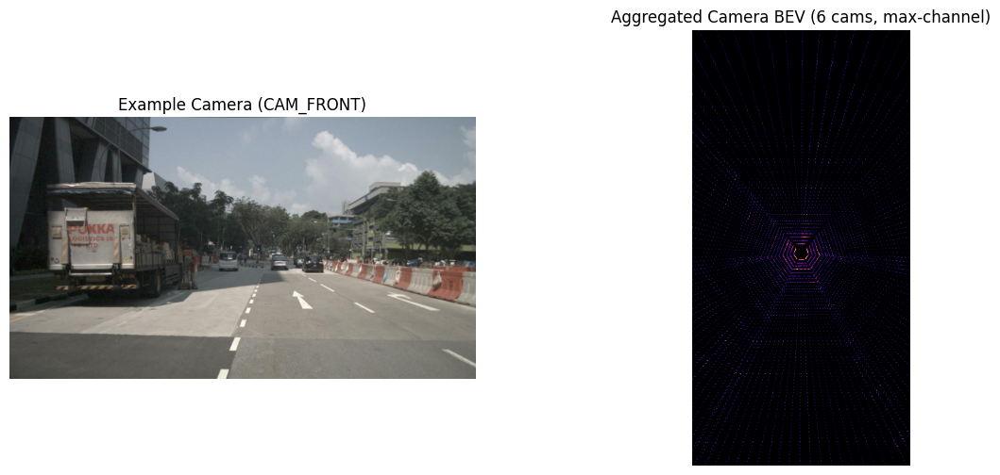

In [67]:
# ---------------------------------------------------------------------
# Visualization: show one input image and the aggregated camera BEV
# ---------------------------------------------------------------------
# pick CAM_FRONT image to display alongside
cam_front_token = sample['data']["CAM_FRONT"]
img_path_front = nusc.get_sample_data_path(cam_front_token)
img_front = cv2.cvtColor(cv2.imread(img_path_front), cv2.COLOR_BGR2RGB)

# max-channel visualization
bev_map = camera_bev[0].max(0)[0].cpu().numpy()

fig, axes = plt.subplots(1,2, figsize=(14,6))
axes[0].imshow(img_front)
axes[0].set_title("Example Camera (CAM_FRONT)")
axes[0].axis("off")

axes[1].imshow(bev_map, cmap='inferno')
axes[1].set_title("Aggregated Camera BEV (6 cams, max-channel)")
axes[1].axis("off")
plt.show()

In [82]:
camera_bev.shape

torch.Size([1, 2048, 500, 250])

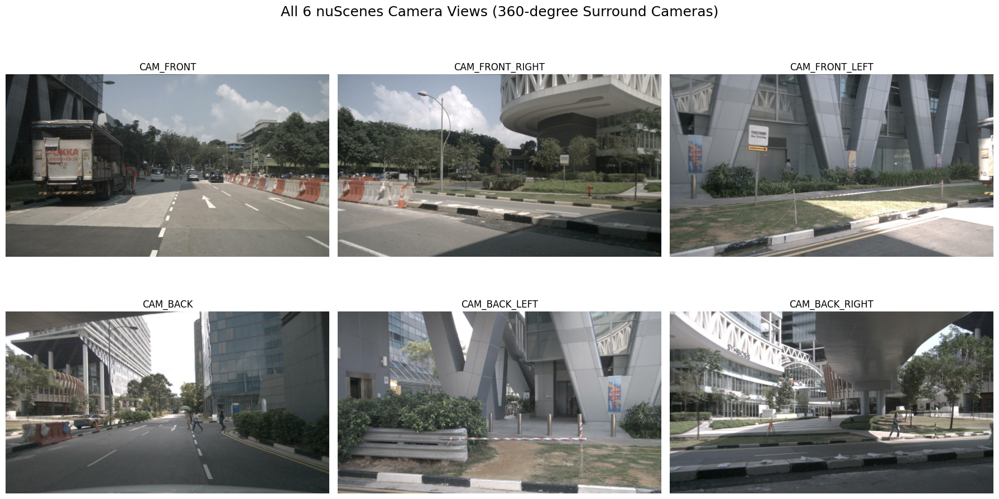

In [59]:
# -----------------------------
# Visualize all 6 camera images
# -----------------------------
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, cam_name in enumerate(camera_names):
    sd_token = sample['data'][cam_name]
    sd_record = nusc.get('sample_data', sd_token)
    img_path = nusc.get_sample_data_path(sd_token)

    img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
    axes[i].imshow(img)
    axes[i].set_title(cam_name)
    axes[i].axis("off")

plt.suptitle("All 6 nuScenes Camera Views (360-degree Surround Cameras)", fontsize=18)
plt.tight_layout()
plt.show()


# LiDAR into BEV [B, C_img, H_img, W_img]

BEV grid: 500 x 250
Using LiDAR file: /kaggle/working/samples/LIDAR_TOP/n015-2018-07-24-11-22-45+0800__LIDAR_TOP__1532402927647951.pcd.bin
Raw points shape: (34688, 4)
Filtered points: 31287
LiDAR BEV shape: torch.Size([1, 64, 500, 250])


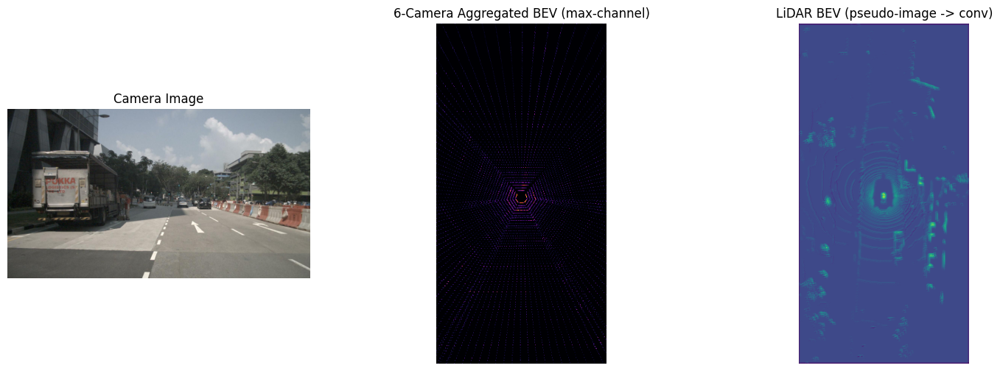

In [71]:
# LiDAR -> BEV (PointPillar-lite)
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
from nuscenes.nuscenes import NuScenes
from nuscenes.utils.data_classes import LidarPointCloud
from nuscenes.utils.geometry_utils import transform_matrix
import cv2

# Re-use quat_to_rotmat from before (or define again)
def quat_to_rotmat(q):
    qw, qx, qy, qz = q
    R = np.array([
        [1 - 2*(qy*qy + qz*qz),     2*(qx*qy - qz*qw),       2*(qx*qz + qy*qw)],
        [2*(qx*qy + qz*qw),         1 - 2*(qx*qx + qz*qz),   2*(qy*qz - qx*qw)],
        [2*(qx*qz - qy*qw),         2*(qy*qz + qx*qw),       1 - 2*(qx*qx + qy*qy)],
    ])
    return R

# -----------------------
# Parameters (match camera BEV)
# -----------------------
x_range = (-50.0, 50.0)     # forward meters
y_range = (-25.0, 25.0)   # left/right meters
z_range = (-3.0, 5.0)     # vertical bounds to keep
voxel_size = 0.2          # meters per BEV cell

H_bev = int((x_range[1] - x_range[0]) / voxel_size)
W_bev = int((y_range[1] - y_range[0]) / voxel_size)
print("BEV grid:", H_bev, "x", W_bev)

# -----------------------
# Tiny "pillar to pseudo-image" network
# -----------------------
class PillarEncoder(nn.Module):
    def __init__(self, in_channels=3, out_channels=64):
        super().__init__()
        # a very small conv net that expands 3->out_channels
        self.net = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )
    def forward(self, x):
        return self.net(x)

# -----------------------
# Load nuScenes and pick a sample
# -----------------------

sample = nusc.sample[0]
lidar_token = sample['data']['LIDAR_TOP']
lidar_sd = nusc.get('sample_data', lidar_token)
lidar_path = nusc.get_sample_data_path(lidar_token)

print("Using LiDAR file:", lidar_path)

# -----------------------
# Read points using SDK helper
# -----------------------
# LidarPointCloud.from_file returns an object with .points of shape (4, N): x,y,z,intensity (homogeneous)
pc = LidarPointCloud.from_file(lidar_path)
points = pc.points  # shape (4, N)
# convert to Nx4
pts = points[:4, :].T  # (N,4) -> columns: x,y,z,intensity
# (note: the SDK may include ring; using first 4 rows is safe for intensity)
print("Raw points shape:", pts.shape)

# -----------------------
# Transform points to ego frame
# -----------------------
# sensor calibrated and ego pose for this sample_data
cs = nusc.get('calibrated_sensor', lidar_sd['calibrated_sensor_token'])
ego_pose = nusc.get('ego_pose', lidar_sd['ego_pose_token'])

# Camera example used quat_to_rotmat earlier; calibrations are quaternion + translation
R_sensor = quat_to_rotmat(cs['rotation'])  # sensor -> ego rotation
T_sensor = np.array(cs['translation'])     # sensor -> ego translation

R_ego = quat_to_rotmat(ego_pose['rotation'])  # ego -> world rotation
T_ego = np.array(ego_pose['translation'])

# Convert sensor points (in sensor frame) to ego frame:
# x_ego = R_sensor @ x_sensor + T_sensor
xyz_sensor = pts[:, :3].T  # (3, N)
xyz_ego = (R_sensor @ xyz_sensor) + T_sensor.reshape(3,1)   # (3, N)

# Optionally apply ego->world to get world coords (skip if BEV is ego-centered)
# xyz_world = (R_ego @ xyz_ego) + T_ego.reshape(3,1)

# Use ego coords for BEV (so BEV is centered on vehicle pose)
x = xyz_ego[0, :]
y = xyz_ego[1, :]
z = xyz_ego[2, :]
intensity = pts[:, 3].astype(np.float32)

# -----------------------
# Filter points within BEV bounds
# -----------------------
mask = (x >= x_range[0]) & (x < x_range[1]) & \
       (y >= y_range[0]) & (y < y_range[1]) & \
       (z >= z_range[0]) & (z < z_range[1])

x = x[mask]; y = y[mask]; z = z[mask]; intensity = intensity[mask]
print("Filtered points:", x.shape[0])

# -----------------------
# Compute BEV pillar indices
# -----------------------
ix = np.floor((x - x_range[0]) / voxel_size).astype(np.int32)  # 0..H_bev-1
iy = np.floor((y - y_range[0]) / voxel_size).astype(np.int32)  # 0..W_bev-1

# -----------------------
# Per-pillar aggregation: count, mean_z, mean_intensity
# -----------------------
# initialize arrays
counts = np.zeros((H_bev, W_bev), dtype=np.float32)
sum_z = np.zeros((H_bev, W_bev), dtype=np.float32)
sum_int = np.zeros((H_bev, W_bev), dtype=np.float32)

# accumulate
for i in range(x.shape[0]):
    px, py = ix[i], iy[i]
    counts[px, py] += 1.0
    sum_z[px, py] += z[i]
    sum_int[px, py] += intensity[i]

# compute means safely
nonzero = counts > 0
mean_z = np.zeros_like(sum_z)
mean_int = np.zeros_like(sum_int)
mean_z[nonzero] = sum_z[nonzero] / counts[nonzero]
mean_int[nonzero] = sum_int[nonzero] / counts[nonzero]

# normalize counts (optional) log scale
counts_norm = np.log1p(counts) / np.log1p(100.0)  # scale to ~[0,1] for up to 100 pts
mean_z_norm = (mean_z - z_range[0]) / (z_range[1] - z_range[0])  # 0..1
mean_int_norm = (mean_int - mean_int.min()) / (mean_int.max() - mean_int.min() + 1e-6)

# stack into pseudo-image channels (C=3)
pseudo = np.stack([counts_norm, mean_z_norm, mean_int_norm], axis=0)  # [3, H_bev, W_bev]
pseudo_torch = torch.tensor(pseudo, dtype=torch.float32).unsqueeze(0)  # [1,3,H,W]

# -----------------------
# Convert pseudo-image -> BEV features via small CNN
# -----------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
pillar_encoder = PillarEncoder(in_channels=3, out_channels=64).to(device)
pillar_encoder.eval()

with torch.no_grad():
    pseudo_torch = pseudo_torch.to(device)
    bev_lidar = pillar_encoder(pseudo_torch)   # [1, 64, H_bev, W_bev]

print("LiDAR BEV shape:", bev_lidar.shape)

# -----------------------
# Visualize LiDAR BEV (max-channel) and side-by-side with camera BEV & image
# -----------------------
# Camera BEV variable assumed available as `bev` from earlier (camera BEV), and original image `image`
# If not, load/compute them first (we assume continuity)

# prepare lidar visualization
bev_lidar_map = bev_lidar[0].max(0)[0].cpu().numpy()

fig, axes = plt.subplots(1,3, figsize=(18,6))
axes[0].imshow(image)
axes[0].set_title("Camera Image")
axes[0].axis('off')

# 2. Fused 6-camera BEV
cam_bev_map = camera_bev[0].max(0)[0].cpu().numpy()
axes[1].imshow(cam_bev_map, cmap='inferno')
axes[1].set_title("6-Camera Aggregated BEV (max-channel)")
axes[1].axis('off')

axes[2].imshow(bev_lidar_map, cmap='viridis')
axes[2].set_title("LiDAR BEV (pseudo-image -> conv)")
axes[2].axis('off')

plt.show()


# Radar into BEV [B, C_img, H_img, W_img]

In [72]:
# ================================================================
#                  RADAR → BEV ENCODER (nuScenes)
# ================================================================

import numpy as np
import torch
import torch.nn as nn
from nuscenes.utils.data_classes import RadarPointCloud

# -------------------------------------------------------------
# 1. Radar parameters: match Camera & LiDAR BEV EXACTLY
# -------------------------------------------------------------
x_range = (-50.0, 50.0)
y_range = (-25.0, 25.0)
z_range = (-5.0, 5.0)
voxel_size = 0.2

H_bev = int((x_range[1]-x_range[0]) / voxel_size)
W_bev = int((y_range[1]-y_range[0]) / voxel_size)

print("Radar BEV resolution:", H_bev, "x", W_bev)

# -------------------------------------------------------------
# 2. Read all 5 radar sensors (nuScenes has 5)
# -------------------------------------------------------------
radar_sensors = [
    "RADAR_FRONT",
    "RADAR_FRONT_LEFT",
    "RADAR_FRONT_RIGHT",
    "RADAR_BACK_LEFT",
    "RADAR_BACK_RIGHT"
]

radar_points_all = []

for radar_name in radar_sensors:
    radar_token = sample['data'][radar_name]
    radar_sd = nusc.get('sample_data', radar_token)
    radar_path = nusc.get_sample_data_path(radar_token)

    # nuScenes RadarPointCloud handles rotation, Doppler, etc automatically
    rpc = RadarPointCloud.from_file(radar_path)

    # extract x,y,z,velocity,rcs
    pts = rpc.points.T  # shape (N, 18)
    # main fields:
    # x,y,z = pts[:, :3]
    # vx_comp, vy_comp = pts[:, 8], pts[:, 9]
    # rcs = pts[:, 5]

    radar_points_all.append(pts)

radar_points_all = np.concatenate(radar_points_all, axis=0)
print("Total radar points:", radar_points_all.shape[0])

# -------------------------------------------------------------
# 3. Transform radar points to ego frame (sensor → ego)
# -------------------------------------------------------------
radar_ego_pts = []

for radar_name in radar_sensors:
    radar_token = sample['data'][radar_name]
    radar_sd = nusc.get('sample_data', radar_token)
    radar_path = nusc.get_sample_data_path(radar_token)

    rpc = RadarPointCloud.from_file(radar_path)
    pts = rpc.points.T[:, :18]   # shape (N,18)

    # get extrinsics
    cs_radar = nusc.get('calibrated_sensor', radar_sd['calibrated_sensor_token'])
    R = quat_to_rotmat(cs_radar['rotation'])
    T = np.array(cs_radar['translation'])

    xyz = pts[:, :3].T  # (3,N)
    xyz_ego = (R @ xyz) + T.reshape(3,1)

    pts[:, 0:3] = xyz_ego.T
    radar_ego_pts.append(pts)

radar_pts = np.concatenate(radar_ego_pts, axis=0)
print("Radar points (ego frame):", radar_pts.shape)

# -------------------------------------------------------------
# 4. Filter radar points inside BEV region
# -------------------------------------------------------------
x = radar_pts[:,0]
y = radar_pts[:,1]
z = radar_pts[:,2]
vx = radar_pts[:,8]   # compensated velocity x
vy = radar_pts[:,9]   # compensated velocity y
rcs = radar_pts[:,5]

mask = (x >= x_range[0]) & (x < x_range[1]) & \
       (y >= y_range[0]) & (y < y_range[1]) & \
       (z >= z_range[0]) & (z < z_range[1])

x = x[mask]; y = y[mask]; z = z[mask]
vx = vx[mask]; vy = vy[mask]; rcs = rcs[mask]

print("Radar points inside BEV:", x.shape[0])

# -------------------------------------------------------------
# 5. Convert to BEV indices
# -------------------------------------------------------------
ix = ((x - x_range[0]) / voxel_size).astype(np.int32)
iy = ((y - y_range[0]) / voxel_size).astype(np.int32)

# -------------------------------------------------------------
# 6. Create 3 radar feature maps: count, velocity, RCS
# -------------------------------------------------------------
count = np.zeros((H_bev, W_bev), dtype=np.float32)
sum_vel = np.zeros((H_bev, W_bev), dtype=np.float32)
sum_rcs = np.zeros((H_bev, W_bev), dtype=np.float32)

for i in range(len(x)):
    px, py = ix[i], iy[i]
    count[px, py] += 1
    sum_vel[px, py] += np.sqrt(vx[i]**2 + vy[i]**2)
    sum_rcs[px, py] += rcs[i]

# normalize
nonzero = count > 0
mean_vel = np.zeros_like(sum_vel)
mean_rcs = np.zeros_like(sum_rcs)

mean_vel[nonzero] = sum_vel[nonzero] / count[nonzero]
mean_rcs[nonzero] = sum_rcs[nonzero] / count[nonzero]

count_norm = np.log1p(count) / np.log1p(10)
vel_norm = mean_vel / (np.max(mean_vel) + 1e-6)
rcs_norm = (mean_rcs - np.min(mean_rcs[nonzero])) / (np.max(mean_rcs[nonzero]) - np.min(mean_rcs[nonzero]) + 1e-6)

# stack channels
radar_pseudo = np.stack([count_norm, vel_norm, rcs_norm], axis=0) # [3,H,W]
radar_pseudo_t = torch.tensor(radar_pseudo, dtype=torch.float32).unsqueeze(0).to(device)

# -------------------------------------------------------------
# 7. Radar CNN encoder → BEV features
# -------------------------------------------------------------
class RadarEncoder(nn.Module):
    def __init__(self, in_ch=3, out_ch=32):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(in_ch, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.Conv2d(16, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)

radar_encoder = RadarEncoder().to(device)
radar_encoder.eval()

with torch.no_grad():
    bev_radar = radar_encoder(radar_pseudo_t)

print("Radar BEV shape:", bev_radar.shape)


Radar BEV resolution: 500 x 250
The history saving thread hit an unexpected error (OperationalError('attempt to write a readonly database')).History will not be written to the database.
Total radar points: 241
Radar points (ego frame): (241, 18)
Radar points inside BEV: 128
Radar BEV shape: torch.Size([1, 32, 500, 250])


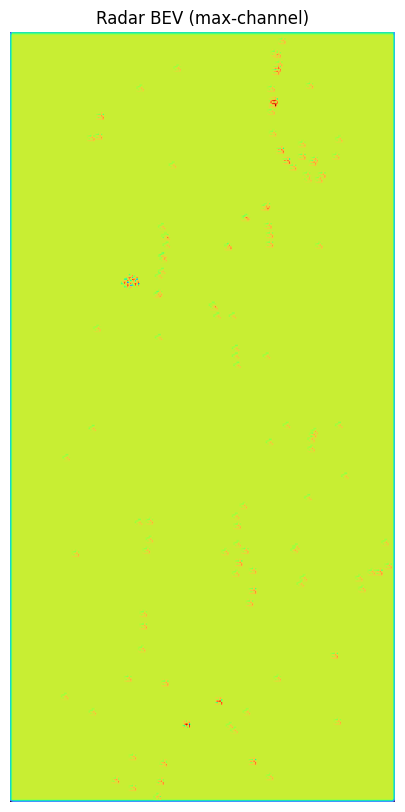

In [73]:
radar_bev_map = bev_radar[0].max(0)[0].cpu().numpy()

plt.figure(figsize=(6,10))
plt.imshow(radar_bev_map, cmap='turbo')
plt.title("Radar BEV (max-channel)")
plt.axis("off")
plt.show()


In [75]:
import torch
import numpy as np

def radar_to_bev_features(radar_points, x_range, y_range, voxel_size, device):
    """
    Converts a sparse set of radar points (already in ego-frame) into a dense 
    BEV feature map using Voxelization and feature aggregation.

    radar_points: numpy array of shape (N, F), where F >= 5 (x, y, z, vx, vy, rcs, ...)
                  (x, y, z, vx, vy are typically the first 5 columns)
    Returns: torch tensor of shape [1, C_radar, H_bev, W_bev]
    """
    if radar_points.size == 0:
        # Handle case with no radar points gracefully
        H_bev = int((x_range[1] - x_range[0]) / voxel_size)
        W_bev = int((y_range[1] - y_range[0]) / voxel_size)
        C_radar = 5  # Must match the number of features encoded below
        return torch.zeros((1, C_radar, H_bev, W_bev), dtype=torch.float32, device=device)

    # 1. Define BEV Grid Dimensions
    X_MIN, X_MAX = x_range
    Y_MIN, Y_MAX = y_range
    H_bev = int((X_MAX - X_MIN) / voxel_size)
    W_bev = int((Y_MAX - Y_MIN) / voxel_size)
    C_radar = 5 # Occupancy, Z, Vx, Vy, RCS

    # 2. Extract Coordinates and Features
    # The first 6 columns of the nuScenes radar points are usually:
    # (x, y, z, dyn_prop, id, rcs) (or similar, depending on nusc.map_pointcloud_to_sensor_format)
    # We will assume a simplified format of (x, y, z, vx, vy, rcs) for generalization
    # NOTE: You MUST verify the exact column mapping for your loaded radar data.
    
    x_coords = radar_points[:, 0]
    y_coords = radar_points[:, 1]
    z_coords = radar_points[:, 2]
    vx_coords = radar_points[:, 3] # Assumes vx is the 4th column
    vy_coords = radar_points[:, 4] # Assumes vy is the 5th column
    rcs_values = radar_points[:, 5] # Assumes rcs is the 6th column 
    
    # 3. Calculate BEV Grid Indices (i, j)
    # i: x-index (Height/Row), j: y-index (Width/Col)
    i = ((x_coords - X_MIN) / voxel_size).astype(np.int32)
    j = ((y_coords - Y_MIN) / voxel_size).astype(np.int32)
    
    # 4. Filter Invalid Points (outside the BEV map)
    valid_mask = (i >= 0) & (i < H_bev) & (j >= 0) & (j < W_bev)
    i, j = i[valid_mask], j[valid_mask]
    
    # Filter all features and coordinates to include only valid points
    valid_z = z_coords[valid_mask]
    valid_vx = vx_coords[valid_mask]
    valid_vy = vy_coords[valid_mask]
    valid_rcs = rcs_values[valid_mask]
    
    # 5. Voxelization and Feature Aggregation (NumPy Approach)
    
    # Initialize BEV map for aggregation: [C_radar, H_bev, W_bev]
    bev_map = np.zeros((C_radar, H_bev, W_bev), dtype=np.float32)
    count_map = np.zeros((H_bev, W_bev), dtype=np.int32) # For mean calculation

    # Use NumPy's advanced indexing and aggregation (slower, but simple)
    # NOTE: For performance, this is often done using torch_scatter or torch.index_add_ 
    # but the logic is complex for multiple feature aggregation. Simple loops are often used here.

    for idx_i, idx_j, z, vx, vy, rcs in zip(i, j, valid_z, valid_vx, valid_vy, valid_rcs):
        # 0. Occupancy: Set to 1
        bev_map[0, idx_i, idx_j] = 1.0 
        
        # Aggregation: For Z, Vx, Vy, RCS, we SUM first, then divide by count later for MEAN.
        bev_map[1, idx_i, idx_j] += z     # Z sum
        bev_map[2, idx_i, idx_j] += vx    # Vx sum
        bev_map[3, idx_i, idx_j] += vy    # Vy sum
        bev_map[4, idx_i, idx_j] += rcs   # RCS sum
        
        # Count the number of points in the cell
        count_map[idx_i, idx_j] += 1
        
    # 6. Normalize Sums to get Mean (Channels 1 to 4)
    # Only divide cells that have at least one point
    valid_cells = count_map > 0
    
    for c in range(1, C_radar):
        # Only perform division where count > 0
        bev_map[c][valid_cells] /= count_map[valid_cells]

    # 7. Convert to PyTorch Tensor and add Batch Dimension
    # Output shape: [1, C_radar, H_bev, W_bev]
    bev_tensor = torch.from_numpy(bev_map).float().unsqueeze(0).to(device)
    
    return bev_tensor

In [76]:
x_range = (-50.0, 50.0)
y_range = (-25.0, 25.0)
voxel_size = 0.2

# --- 1. Get the RADAR Sample Data Token ---
# The nuScenes dataset aggregates all individual radar sensor data 
# (typically 5 sensors) into a single FUSED point cloud at the ego-vehicle center.
radar_token = sample['data']['RADAR_FRONT'] # Or any key, but 'RADAR_FRONT' is common for the fused record

# 2. Get the Sample Data Record and Path
sd_record = nusc.get('sample_data', radar_token)
pc_path = nusc.get_sample_data_path(radar_token)

# --- 3. Load and Extract the Fused Radar Points ---
# The nuScenes API provides a helper to load and transform the point cloud.
# The PointCloud.from_file function handles loading from the .pcd file.
# The points are typically already transformed to the EGO-VEHICLE FRAME.
from nuscenes.utils.data_classes import RadarPointCloud

# Load the point cloud from the file path
radar_pc = RadarPointCloud.from_file(str(pc_path))

# The points are stored in a [18, N] format (18 features for N points).
# We need to transpose it to the [N, 18] format for easier slicing.
# NOTE: RadarPointCloud's .points are already in the ego-vehicle frame.
radar_points_ego_frame = radar_pc.points.T # Shape: [N, 18]

# --- 4. Select and Verify the Required Features ---
# The columns in radar_points_ego_frame are:
# 0: x, 1: y, 2: z, 3: dyn_prop, 4: id, 5: rcs, 6: vx, 7: vy, 8: vx_comp, 9: vy_comp, ...
# The 'vx_comp' and 'vy_comp' (compensated velocity) are the most useful.
# We will use: x, y, z, vx_comp, vy_comp, rcs

# Indices for the required features in the nuScenes format:
X_IDX, Y_IDX, Z_IDX = 0, 1, 2
VX_COMP_IDX, VY_COMP_IDX = 8, 9 # Compensated velocity is crucial
RCS_IDX = 5

# Create a filtered array with only the necessary features
# Shape will be [N, 6] (x, y, z, vx_comp, vy_comp, rcs)
filtered_radar_points = radar_points_ego_frame[:, [
    X_IDX, Y_IDX, Z_IDX, VX_COMP_IDX, VY_COMP_IDX, RCS_IDX
]]


# --- 5. Call the Function to Create the BEV Map ---

with torch.no_grad():
    radar_bev = radar_to_bev_features(
        filtered_radar_points,
        x_range=x_range,
        y_range=y_range,
        voxel_size=voxel_size,
        device=device
    )

# --- Output ---
# radar_bev shape: [1, 5, H_bev, W_bev] (The 5 is C_radar, where 5 features were encoded)
print(f"Radar BEV Feature Map Shape: {radar_bev.shape}")
print(f"Radar BEV Features (C_radar=5): Occupancy, Mean_Z, Mean_Vx, Mean_Vy, Mean_RCS")


Radar BEV Feature Map Shape: torch.Size([1, 5, 500, 250])
Radar BEV Features (C_radar=5): Occupancy, Mean_Z, Mean_Vx, Mean_Vy, Mean_RCS


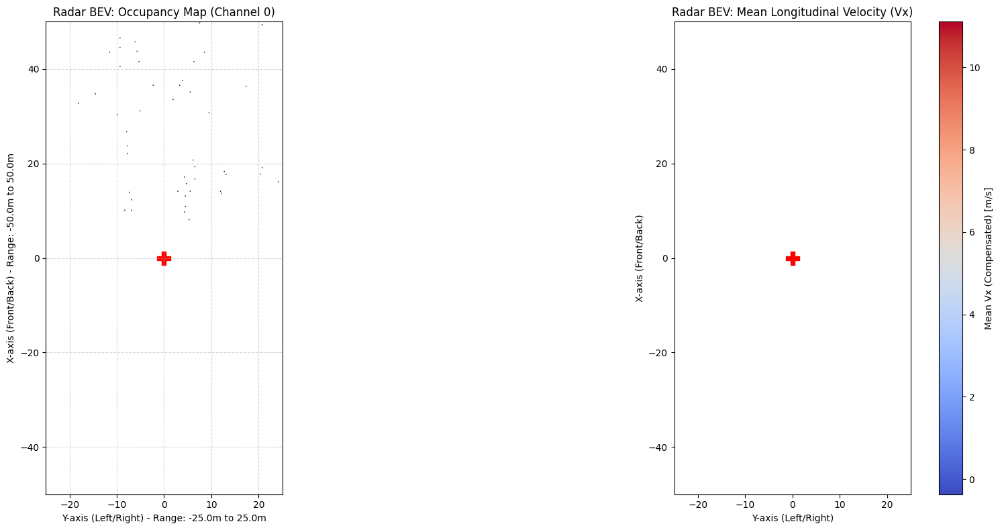

In [78]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# --- ASSUMPTIONS ---
# 1. 'radar_bev' is your torch tensor of shape [1, 5, H_bev, W_bev]
# 2. BEV Grid Parameters
x_range = (-50.0, 50.0)
y_range = (-25.0, 25.0)

# -------------------------------------------------------------
# VISUALIZATION STEPS
# -------------------------------------------------------------

# Extract the feature channels we want to plot (Batch 0)
radar_bev_b0 = radar_bev[0].cpu().numpy()  # Shape: [5, H_bev, W_bev]

# Channel Indices
OCCUPANCY_CHANNEL = 0
MEAN_VX_CHANNEL = 2  # Assuming this holds the Mean Vx_comp (front/back velocity)

H_bev, W_bev = radar_bev_b0.shape[1], radar_bev_b0.shape[2]

fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# -------------------------------------------------------------
# PLOT 1: RADAR OCCUPANCY (Where are the objects?)
# -------------------------------------------------------------
occupancy_map = radar_bev_b0[OCCUPANCY_CHANNEL]

axes[0].imshow(
    occupancy_map, 
    origin='lower', 
    cmap='gray_r', # White for occupied, black for empty
    extent=[y_range[0], y_range[1], x_range[0], x_range[1]] # Set real-world axis limits
)

axes[0].set_title("Radar BEV: Occupancy Map (Channel 0)")
axes[0].set_xlabel(f"Y-axis (Left/Right) - Range: {y_range[0]}m to {y_range[1]}m")
axes[0].set_ylabel(f"X-axis (Front/Back) - Range: {x_range[0]}m to {x_range[1]}m")
axes[0].grid(True, alpha=0.5, linestyle='--')
# Highlight the origin (Ego Vehicle)
axes[0].scatter(0, 0, color='red', marker='P', s=200, label='Ego Vehicle')


# -------------------------------------------------------------
# PLOT 2: RADAR VELOCITY (What are the objects doing?)
# -------------------------------------------------------------
vx_map = radar_bev_b0[MEAN_VX_CHANNEL]

# Mask out empty cells for visualization (don't color the empty space)
velocity_masked_map = np.ma.masked_where(occupancy_map == 0, vx_map)

# Use a diverging color map (e.g., coolwarm) for positive/negative velocity
im = axes[1].imshow(
    velocity_masked_map, 
    origin='lower', 
    cmap='coolwarm',
    extent=[y_range[0], y_range[1], x_range[0], x_range[1]]
)

axes[1].set_title("Radar BEV: Mean Longitudinal Velocity (Vx)")
axes[1].set_xlabel(f"Y-axis (Left/Right)")
axes[1].set_ylabel(f"X-axis (Front/Back)")
axes[1].scatter(0, 0, color='red', marker='P', s=200, label='Ego Vehicle')

# Add a colorbar for the velocity
cbar = fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
cbar.set_label('Mean Vx (Compensated) [m/s]')


# --- Interpretation of Velocity Colorbar ---
# e.g., Blue: Object moving away from ego (-Vx)
# e.g., Red: Object moving towards ego (+Vx)

plt.tight_layout()
plt.show()

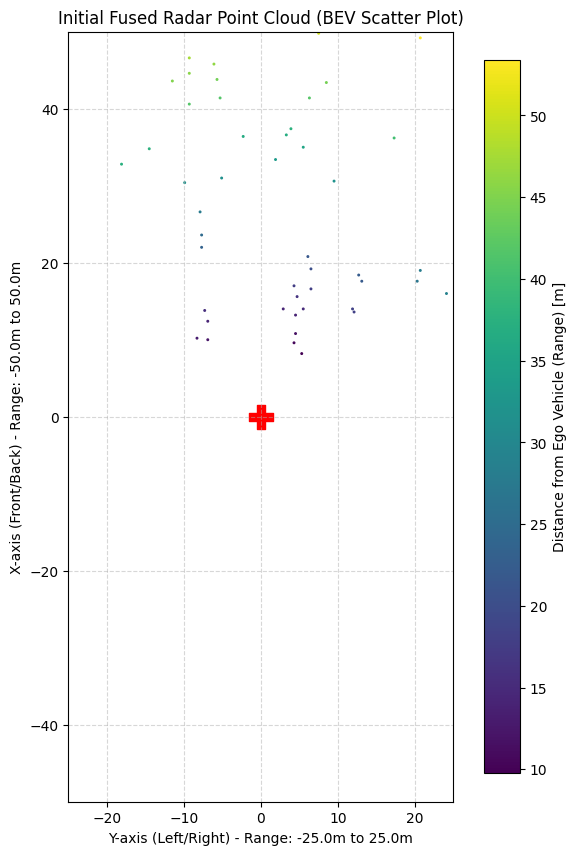

In [79]:
import numpy as np
import matplotlib.pyplot as plt

# --- ASSUMPTIONS ---
# 1. 'filtered_radar_points' is your NumPy array of shape [N, 6] 
#    containing [x, y, z, vx_comp, vy_comp, rcs]
# 2. BEV Grid Parameters
x_range = (-50.0, 50.0)
y_range = (-25.0, 25.0)

# -------------------------------------------------------------
# VISUALIZATION STEPS
# -------------------------------------------------------------

# 1. Extract X, Y, and a Color-Coding Feature (Distance)
x_coords = filtered_radar_points[:, 0]
y_coords = filtered_radar_points[:, 1]
z_coords = filtered_radar_points[:, 2]

# Calculate the distance (range) of each point from the origin (ego vehicle)
# range = sqrt(x^2 + y^2 + z^2)
range_values = np.sqrt(x_coords**2 + y_coords**2 + z_coords**2)


# 2. Filter points to only include those within the BEV grid bounds for a clean plot
mask = (x_coords >= x_range[0]) & (x_coords <= x_range[1]) & \
       (y_coords >= y_range[0]) & (y_coords <= y_range[1])

x_plot = x_coords[mask]
y_plot = y_coords[mask]
range_plot = range_values[mask]


# 3. Plotting the Scatter Plot
plt.figure(figsize=(10, 10))

# Create the scatter plot. C=range_plot colors the points by their distance.
scatter = plt.scatter(
    y_plot,         # Plot Y-coordinates on the X-axis (Left/Right)
    x_plot,         # Plot X-coordinates on the Y-axis (Front/Back)
    s=5,            # Point size
    c=range_plot,   # Color by distance
    cmap='viridis', # Colormap
    marker='.'
)

plt.title("Initial Fused Radar Point Cloud (BEV Scatter Plot)")
plt.xlabel(f"Y-axis (Left/Right) - Range: {y_range[0]}m to {y_range[1]}m")
plt.ylabel(f"X-axis (Front/Back) - Range: {x_range[0]}m to {x_range[1]}m")

# Set the axis limits to match the BEV grid for direct comparison
plt.xlim(y_range)
plt.ylim(x_range)
plt.gca().set_aspect('equal', adjustable='box') # Ensure X and Y scales are equal

# Add a colorbar for the distance
cbar = plt.colorbar(scatter, fraction=0.046, pad=0.04)
cbar.set_label('Distance from Ego Vehicle (Range) [m]')

# Highlight the origin (Ego Vehicle)
plt.scatter(0, 0, color='red', marker='P', s=300, label='Ego Vehicle')
plt.grid(True, alpha=0.5, linestyle='--')
plt.show()

Number of radar points: 74


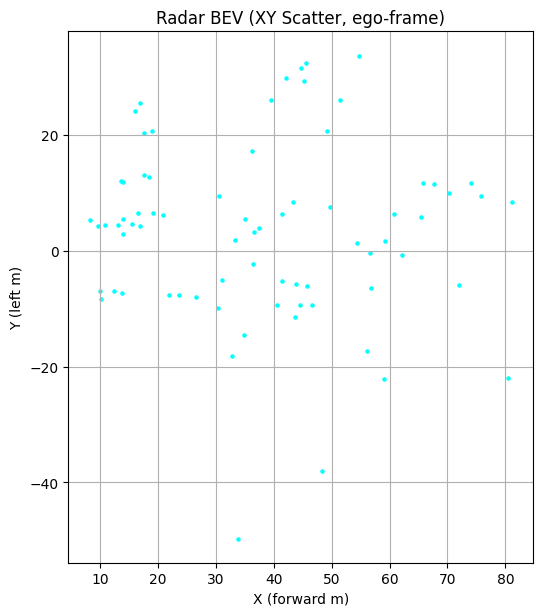

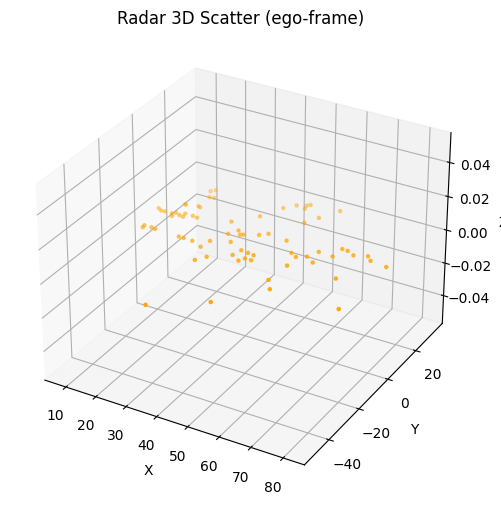

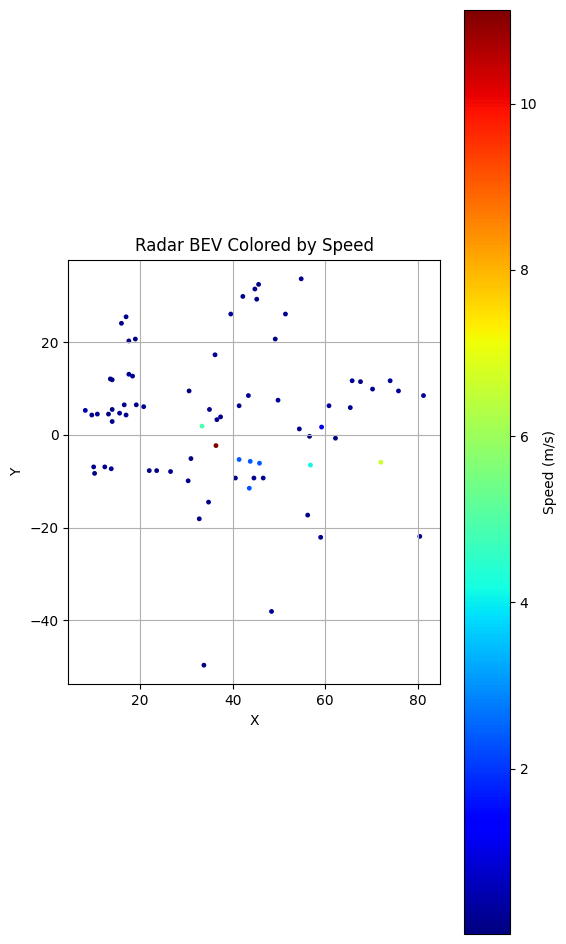

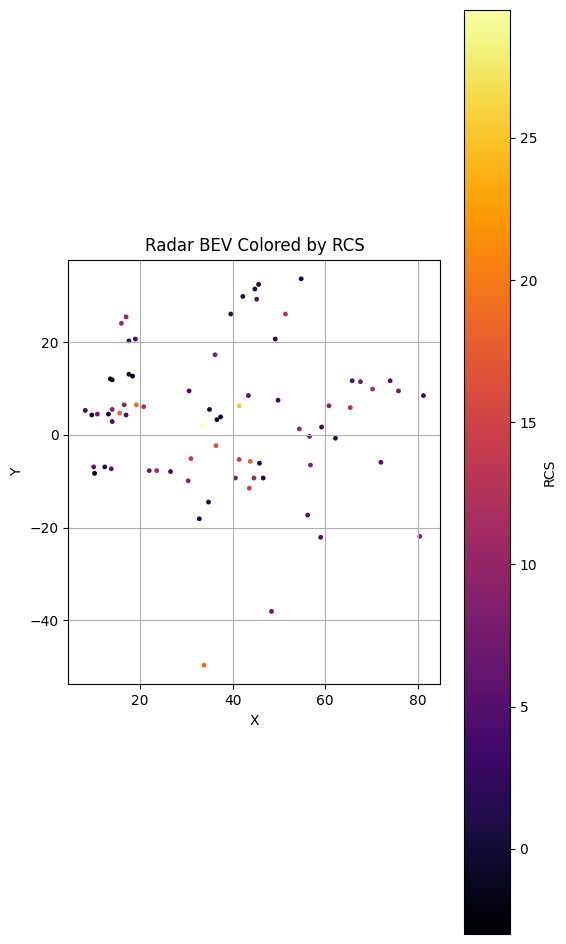

In [93]:
import numpy as np
import matplotlib.pyplot as plt
from nuscenes.utils.data_classes import RadarPointCloud
from mpl_toolkits.mplot3d import Axes3D

# --- Load the fused radar ---
radar_token = sample['data']['RADAR_FRONT']
pc_path = nusc.get_sample_data_path(radar_token)
radar_pc = RadarPointCloud.from_file(pc_path)

# Extract useful fields
pts = radar_pc.points  # shape: (18, N)
x = pts[0]
y = pts[1]
z = pts[2]
rcs = pts[5]
vx = pts[8]
vy = pts[9]
speed = np.sqrt(vx**2 + vy**2)

print("Number of radar points:", pts.shape[1])

# ------ 1) BEV TOP-DOWN SCATTER ------
plt.figure(figsize=(6,12))
plt.scatter(x, y, s=5, c='cyan')
plt.title("Radar BEV (XY Scatter, ego-frame)")
plt.xlabel("X (forward m)")
plt.ylabel("Y (left m)")
plt.gca().set_aspect('equal')
plt.grid(True)
plt.show()

# ------ 2) 3D SCATTER ------
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, s=5, c='orange')
ax.set_title("Radar 3D Scatter (ego-frame)")
ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
plt.show()

# ------ 3) COLOR BY VELOCITY ------
plt.figure(figsize=(6,12))
plt.scatter(x, y, s=6, c=speed, cmap='jet')
plt.title("Radar BEV Colored by Speed")
plt.xlabel("X")
plt.ylabel("Y")
plt.colorbar(label="Speed (m/s)")
plt.gca().set_aspect('equal')
plt.grid(True)
plt.show()

# ------ 4) COLOR BY RCS ------
plt.figure(figsize=(6,12))
plt.scatter(x, y, s=6, c=rcs, cmap='inferno')
plt.title("Radar BEV Colored by RCS")
plt.xlabel("X")
plt.ylabel("Y")
plt.colorbar(label="RCS")
plt.gca().set_aspect('equal')
plt.grid(True)
plt.show()


# Fusing Camera+Radar+Lidar

In [84]:
camera_bev.shape

torch.Size([1, 2048, 500, 250])

In [85]:
bev_lidar.shape

torch.Size([1, 64, 500, 250])

In [86]:
radar_bev.shape

torch.Size([1, 5, 500, 250])

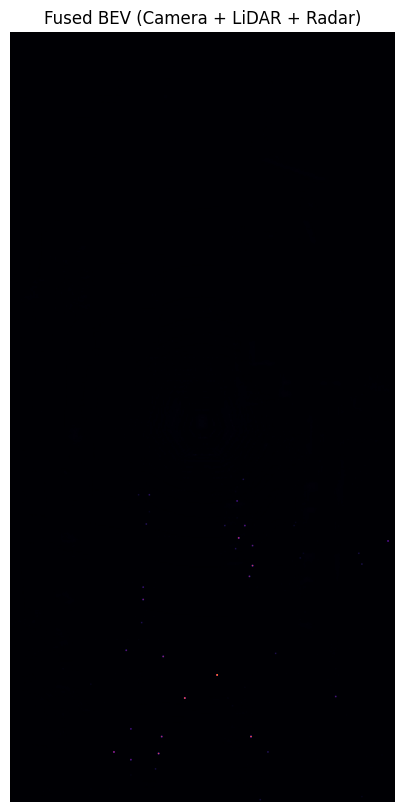

In [97]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt

# =============================
# Reduce channels
# =============================
cam_reduce = nn.Conv2d(2048, 256, 1).to(device)
lidar_reduce = nn.Conv2d(64, 256, 1).to(device)
radar_reduce = nn.Conv2d(5, 256, 1).to(device)

cam_reduce.eval(); lidar_reduce.eval(); radar_reduce.eval()

with torch.no_grad():
    cam_256   = cam_reduce(camera_bev)    # [1,256,500,250]
    lidar_256 = lidar_reduce(bev_lidar)   # [1,256,500,250]
    radar_256 = radar_reduce(radar_bev)   # [1,256,500,250]

# =============================
# Dummy weight fusion
# =============================
w_cam, w_lidar, w_radar = 0.2, 0.5, 0.3

with torch.no_grad():
    fused_bev = (
        w_cam   * cam_256 +
        w_lidar * lidar_256 +
        w_radar * radar_256
    )

# =============================
# Optional: learned 1×1 fusion
# =============================
fusion_conv = nn.Conv2d(256*3, 256, 1).to(device)
fusion_conv.eval()

with torch.no_grad():
    concat = torch.cat([cam_256, lidar_256, radar_256], dim=1)  # [1,768,500,250]
    fused_bev_learned = fusion_conv(concat)

# =============================
# Visualize fused BEV
# =============================
fused_map = fused_bev[0].max(0)[0].cpu().numpy()
fused_map = (fused_map - fused_map.min()) / (fused_map.max() - fused_map.min() + 1e-6)

plt.figure(figsize=(6,10))
plt.imshow(fused_map, cmap='inferno')
plt.title("Fused BEV (Camera + LiDAR + Radar)")
plt.axis('off')
plt.show()


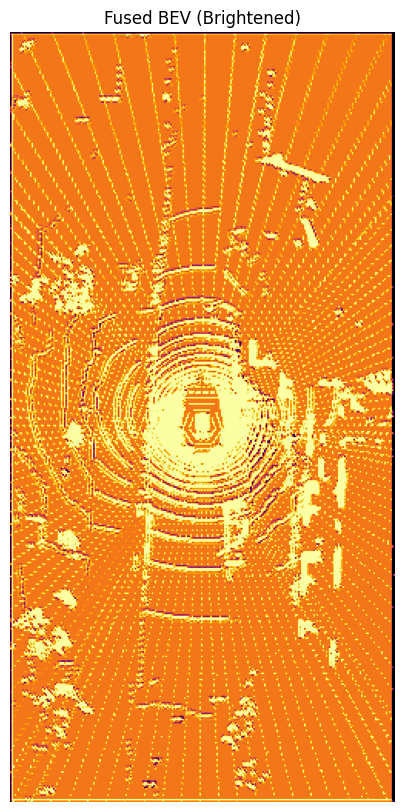

In [98]:
# =============================
# Visualize fused BEV (BRIGHTER)
# =============================
fused_map = fused_bev[0].max(0)[0].cpu().numpy()

# Normalize
fused_map = (fused_map - fused_map.min()) / (fused_map.max() - fused_map.min() + 1e-6)

# ---- Brightening Options ----
# 1. Gamma correction
gamma = 0.5
fused_map = fused_map ** gamma

# 2. Contrast stretching
p1, p99 = np.percentile(fused_map, (1, 99))
fused_map = np.clip((fused_map - p1) / (p99 - p1 + 1e-6), 0, 1)

# 3. Optional brightness boost
fused_map = np.clip(fused_map * 2.5, 0, 1)

# ---- Plot ----
plt.figure(figsize=(6,10))
plt.imshow(fused_map, cmap='inferno')
plt.title("Fused BEV (Brightened)")
plt.axis('off')
plt.show()
